# Starbucks Drinks for Low Carbohydrate Diet

#### Nutrition Facts for Starbucks Menu

#### About the Dataset.

Since coffee is the heart and the driving innovation at Starbucks, we are going to use the Starbucks drink menu expanded. 

#### Context:

Starbucks is an American coffee chain founded in Seattle. It serves both beverages and food.

#### Content:

This dataset includes the nutritional information for Starbucks’ food and drink menu items. All nutritional information for drinks are for a 12oz serving size.

#### Acknowledgements:

Food composition data is in the public domain, but product names marked with ® or ™ remain the registered trademarks of Starbucks.

#### Inspiration:

Which among their coffee drinks is the healthiest drink based on calories, sugar and caffeine content taking into account the beverage category(coffee or tea), beverage(caffe latte, caffe mocha, smoothie etc), beverage prep(with or without milk).

Which Starbucks drink, coffee or tea would be the best or recommended for a keto diet?

Which Starbucks drink, coffee or tea would be the best or recommended for a diabetic diet?

#### Audience:

Non technical people interested in healthier choices of Starbucks drinks.

### NOTE: All the following bolded cells guide the STORYTELLING. Additional comments are also added for technical reference, but not part of the formal presentation.

```

```

### Everybody loves Starbucks. I love to go to Starbucks for tea and my husband likes coffee. I'm trying to follow a keto diet and my husband to follow a diabetic diet.  What drinks whether tea or coffee should we be looking at? There are a lot of drinks at Starbucks that taste very good but not really good you, specially when you want to follow a strict low carbohydrate diet. The question is, how can we choose smarter and healthier when we go to Starbucks?

### We obtained the Starbucks data from Kaggle. We will be reviewing the data from the expanded drink menu.

In [1]:
# Imports
import os
import pandas as pd
import numpy as np
import glob
import random
random.seed(1)
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from sklearn.preprocessing import OneHotEncoder
from statsmodels.stats.proportion import proportions_ztest
import ydata_profiling
#!pip install termcolor
#from termcolor import colored
#!pip install colorama
from colorama import Fore, Back, Style
import statsmodels.stats.weightstats as ws

In [2]:
#read in the dataset 
starbucks_dataset = pd.read_csv('starbucks_drinkMenu_expanded.csv')

In [3]:
#check the head of the transposed dataframe
starbucks_dataset.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
Beverage_category,Coffee,Coffee,Coffee,Coffee,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks,Classic Espresso Drinks
Beverage,Brewed Coffee,Brewed Coffee,Brewed Coffee,Brewed Coffee,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Latte,Caffè Mocha (Without Whipped Cream),Caffè Mocha (Without Whipped Cream),Caffè Mocha (Without Whipped Cream),Caffè Mocha (Without Whipped Cream)
Beverage_prep,Short,Tall,Grande,Venti,Short Nonfat Milk,2% Milk,Soymilk,Tall Nonfat Milk,2% Milk,Soymilk,Grande Nonfat Milk,2% Milk,Soymilk,Venti Nonfat Milk,2% Milk,Soymilk,Short Nonfat Milk,2% Milk,Soymilk,Tall Nonfat Milk
Calories,3,4,5,5,70,100,70,100,150,110,130,190,150,170,240,190,110,130,110,170
Total Fat (g),0.1,0.1,0.1,0.1,0.1,3.5,2.5,0.2,6,4.5,0.3,7,5,0.4,9,7,1.5,4,3.5,2
Trans Fat (g),0.0,0.0,0.0,0.0,0.1,2.0,0.4,0.2,3.0,0.5,0.2,3.5,0.5,0.3,4.5,1.0,1.0,2.0,1.0,1.0
Saturated Fat (g),0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.2,0.0,0.0,0.2,0.0,0.0,0.3,0.0,0.0,0.1,0.0,0.0
Sodium (mg),0,0,0,0,5,15,0,5,25,0,5,30,0,10,35,0,5,10,0,5
Total Carbohydrates (g),5,10,10,10,75,85,65,120,135,105,150,170,130,190,220,170,60,70,55,100
Cholesterol (mg),0,0,0,0,10,10,6,15,15,10,19,19,13,25,24,16,21,21,19,32


In [4]:
#call the  info method on starbucks_dataset to see a summary of the data and the datatypes present
starbucks_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242 entries, 0 to 241
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Beverage_category          242 non-null    object 
 1   Beverage                   242 non-null    object 
 2   Beverage_prep              242 non-null    object 
 3   Calories                   242 non-null    int64  
 4    Total Fat (g)             242 non-null    object 
 5   Trans Fat (g)              242 non-null    float64
 6   Saturated Fat (g)          242 non-null    float64
 7    Sodium (mg)               242 non-null    int64  
 8    Total Carbohydrates (g)   242 non-null    int64  
 9   Cholesterol (mg)           242 non-null    int64  
 10   Dietary Fibre (g)         242 non-null    int64  
 11   Sugars (g)                242 non-null    int64  
 12   Protein (g)               242 non-null    float64
 13  Vitamin A (% DV)           242 non-null    object 

### As we reviewed the data, we did noticed that one of the columns seem to be missing some data. We will need to investigate this before we can do a proper analysis.

In [5]:
#find out the shape of the data to determine the number of rows and columns
starbucks_dataset.shape

(242, 18)

In [6]:
# print out the columns of the datatset
starbucks_dataset.columns

Index(['Beverage_category', 'Beverage', 'Beverage_prep', 'Calories',
       ' Total Fat (g)', 'Trans Fat (g) ', 'Saturated Fat (g)', ' Sodium (mg)',
       ' Total Carbohydrates (g) ', 'Cholesterol (mg)', ' Dietary Fibre (g)',
       ' Sugars (g)', ' Protein (g) ', 'Vitamin A (% DV) ', 'Vitamin C (% DV)',
       ' Calcium (% DV) ', 'Iron (% DV) ', 'Caffeine (mg)'],
      dtype='object')

In [7]:
#we can also find what datatypes the data has by calling .dtypes
starbucks_dataset.dtypes

Beverage_category             object
Beverage                      object
Beverage_prep                 object
Calories                       int64
 Total Fat (g)                object
Trans Fat (g)                float64
Saturated Fat (g)            float64
 Sodium (mg)                   int64
 Total Carbohydrates (g)       int64
Cholesterol (mg)               int64
 Dietary Fibre (g)             int64
 Sugars (g)                    int64
 Protein (g)                 float64
Vitamin A (% DV)              object
Vitamin C (% DV)              object
 Calcium (% DV)               object
Iron (% DV)                   object
Caffeine (mg)                 object
dtype: object

In [8]:
#calling the describe method gives you a descriptive statistics summary of the data; 
starbucks_dataset.describe()

,Calories,Trans Fat (g),Saturated Fat (g),Sodium (mg),Total Carbohydrates (g),Cholesterol (mg),Dietary Fibre (g),Sugars (g),Protein (g)
count,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000
mean,193.871901,1.307025,0.037603,6.363636,128.884298,35.991736,0.805785,32.962810,6.978512
std,102.863303,1.640259,0.071377,8.630257,82.303223,20.795186,1.445944,19.730199,4.871659
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,120.000000,0.100000,0.000000,0.000000,70.000000,21.000000,0.000000,18.000000,3.000000
50%,185.000000,0.500000,0.000000,5.000000,125.000000,34.000000,0.000000,32.000000,6.000000
75%,260.000000,2.000000,0.100000,10.000000,170.000000,50.750000,1.000000,43.750000,10.000000
max,510.000000,9.000000,0.300000,40.000000,340.000000,90.000000,8.000000,84.000000,20.000000


In [9]:
#call in .nunique() method to return the number of uniques values for each column of the dataset
starbucks_dataset.nunique()

Beverage_category             9
Beverage                     33
Beverage_prep                13
Calories                     48
 Total Fat (g)               24
Trans Fat (g)                18
Saturated Fat (g)             4
 Sodium (mg)                  9
 Total Carbohydrates (g)     51
Cholesterol (mg)             75
 Dietary Fibre (g)            8
 Sugars (g)                  70
 Protein (g)                 26
Vitamin A (% DV)             11
Vitamin C (% DV)             10
 Calcium (% DV)              14
Iron (% DV)                  18
Caffeine (mg)                36
dtype: int64

In [10]:
#The following loops over all the columns and identifies the unique values in each one. This was used to determine
#what, if any, data cleaning would be needed. This information is used in the next cell. It is commented out for brevity.

#for i in starbucks_dataset.columns:
#    print(i)
#    print(starbucks_dataset[i].unique())

In [11]:
#Removing all the percent signs so we can convert the columns to numbers. 
starbucks_dataset = starbucks_dataset.replace('%', '', regex=True)

#Replacing the empty values and the none numeric values with a temporary placeholder that is not in the dataset. 
#Note: this value was chosen after inspecting the unique values from the above cell.
starbucks_dataset['Caffeine (mg)'] = starbucks_dataset['Caffeine (mg)'].replace(to_replace='Varies', value='varies')
starbucks_dataset['Caffeine (mg)'].replace(to_replace='varies', value='-2', inplace=True)
starbucks_dataset['Caffeine (mg)'].replace(to_replace=np.nan, value='-2', inplace=True)

#Correcting what appears to be a missing decimal. 
starbucks_dataset[' Total Fat (g)'].replace('3 2', '3.2', inplace=True)

#Converting all of our object types to floats for numerical columns.
for i in [ 'Calories', ' Total Fat (g)', 'Trans Fat (g) ', 'Saturated Fat (g)', ' Sodium (mg)', ' Total Carbohydrates (g) ', 'Cholesterol (mg)', ' Dietary Fibre (g)', ' Sugars (g)', ' Protein (g) ', 'Vitamin A (% DV) ', 'Vitamin C (% DV)', ' Calcium (% DV) ', 'Iron (% DV) ', 'Caffeine (mg)']:
    starbucks_dataset[i] = starbucks_dataset[i].astype('float')

#Imputing the missing caffeine values. The missing values are identified by the placeholder value mentioned earlier.
#The imputed value is the mean of the other values in the column.
starbucks_dataset['Caffeine (mg)'].replace(to_replace=-2.0, value=pd.NA, inplace=True)
starbucks_dataset['Caffeine (mg)'] = starbucks_dataset['Caffeine (mg)'].fillna(starbucks_dataset['Caffeine (mg)'].mean())

#Verifying all columns have the same number of items
starbucks_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242 entries, 0 to 241
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Beverage_category          242 non-null    object 
 1   Beverage                   242 non-null    object 
 2   Beverage_prep              242 non-null    object 
 3   Calories                   242 non-null    float64
 4    Total Fat (g)             242 non-null    float64
 5   Trans Fat (g)              242 non-null    float64
 6   Saturated Fat (g)          242 non-null    float64
 7    Sodium (mg)               242 non-null    float64
 8    Total Carbohydrates (g)   242 non-null    float64
 9   Cholesterol (mg)           242 non-null    float64
 10   Dietary Fibre (g)         242 non-null    float64
 11   Sugars (g)                242 non-null    float64
 12   Protein (g)               242 non-null    float64
 13  Vitamin A (% DV)           242 non-null    float64

In [12]:
#The following loops over all the columns and identifies the unique values in each one. This was used to verify the
#data was cleaned appropriately. It is commented out for brevity.

#for i in starbucks_dataset.columns:
#    print(i)
#    print(starbucks_dataset[i].unique())

```
Nutritional Information of a 12oz Can of Coke Classic to be used for comparison purposes.

140 calories; 
0 g sat fat (0% DV); 
45 mg sodium (2% DV); 
39 g sugars. 
39 g carbos.
Caffeine content: 34 mg
```

In [13]:
#We are reviewing the attributes of the overall menu data  to begin understanding the data.
starbucks_dataset[['Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].describe().T

,count,mean,std,min,25%,50%,75%,max
Calories,242.0,193.871901,102.863303,0.0,120.0,185.000000,260.00,510.0
Total Carbohydrates (g),242.0,128.884298,82.303223,0.0,70.0,125.000000,170.00,340.0
Sugars (g),242.0,32.962810,19.730199,0.0,18.0,32.000000,43.75,84.0
Cholesterol (mg),242.0,35.991736,20.795186,0.0,21.0,34.000000,50.75,90.0
Caffeine (mg),242.0,89.520548,61.560774,0.0,70.0,89.520548,130.00,410.0


### Comparing Starbucks menu to a can of Coke, we can see that the median of these attributes are generally quite a bit higher than the Coke. Of course, we can not make any real distinctions at this point as we are comparing the entire menu, which we know has drinks that are not tea or coffee. 

### As you can see, Starbucks median calories of all of their drinks is 185 compared to Coke's 140. Likewise,  Total Carbohydrates for Starbucks is 125 g with Coke being 39 g.  Surprisingly, Starbuck's sugar is 32 g compared to Coke's 39 g. Cholesterol for Starbuck's is 34 mg with Coke having none. Starbuck's has 90 mg of caffeine while Coke has  34 mg.

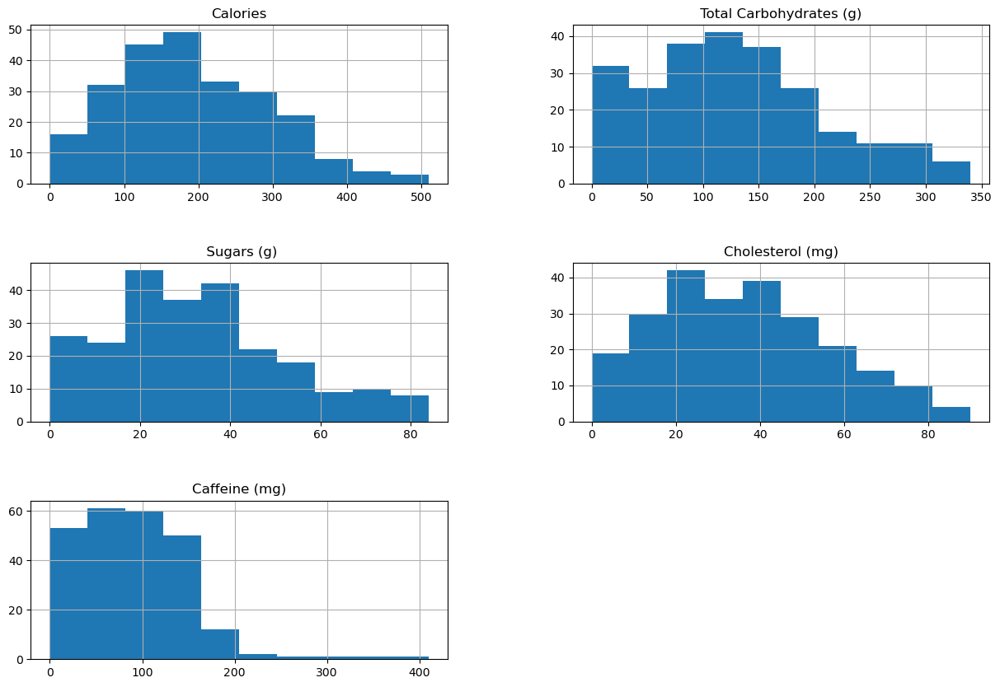

In [14]:
#Checking the individual variable distribution plots
#show histogram for each varible in the dataset
#hist =starbucks_dataset.hist(bins=10, figsize=(15,10))
starbucks_dataset[['Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5);

### The above histograms give us a more detailed view of how the drinks differing amounts of Calories, Total Carbohydrates, Sugars, Cholesterol and Caffeine. The height of the bar tells us approximately how many drinks have a given amount of each item.

In [15]:
# Generate the Pandas Profile report for EDA analysis
report = ydata_profiling.ProfileReport(starbucks_dataset, explorative=True)
report.to_file(output_file="profile.html")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Reviewing the Heatmap, we found several correlations that may warrant additional investigation to add on to our results.  Reviewing the scatter plots of these correlations, we found the following:

#### Highly Correlated:
- Calories vs. Sugar
- Calories vs. Cholesterol
- Total Carbohydrates vs. Sugar
- Protein vs. Calcium
- Vitamin A vs. Calcium

#### Possibly Correlated:
- Calories vs. Total Fats
- Protein vs. Vitamin A

#### Not Correlated:
- Calories vs. Transfat
- Sodium vs. Saturated FAts
- Total Carbohydrates vs. Cholesterol
- Fiber vs. Iron
- Vitamin C vs. Beverage drink


In [18]:
#Adding a new column of Type. We then classify all the drinks as coffee, tea or smoothies. We are not interested
#in smoothies and will ignore these.
starbucks_dataset['Type']='coffee'
starbucks_dataset.loc[starbucks_dataset['Beverage_category'] == 'Smoothies', 'Type'] = 'smoothies'
starbucks_dataset.loc[starbucks_dataset['Beverage_category'] == 'Tazo® Tea Drinks', 'Type'] = 'tea'
starbucks_dataset.loc[starbucks_dataset['Beverage'] == 'Shaken Iced Tazo® Tea (With Classic Syrup)', 'Type'] = 'tea'
starbucks_dataset.loc[starbucks_dataset['Beverage'] ==  'Shaken Iced Tazo® Tea Lemonade (With Classic Syrup)', 'Type'] = 'tea'

### We want to split the menu into the categories of coffee or tea. Any other drinks we will want to ignore.

In [20]:
#Create a tea dataset by selecting only items of Type = tea. 
tea_dataset = starbucks_dataset[starbucks_dataset['Type'] == 'tea']
#Display the statistics of the 5 categories we are interested in.
tea_dataset[['Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].describe().T

,count,mean,std,min,25%,50%,75%,max
Calories,58.0,170.689655,95.749345,0.0,112.50,160.000000,217.500000,450.0
Total Carbohydrates (g),58.0,80.603448,54.241804,0.0,46.25,80.000000,110.000000,230.0
Sugars (g),58.0,30.155172,16.028266,0.0,20.25,30.000000,39.000000,71.0
Cholesterol (mg),58.0,31.413793,16.724847,0.0,21.25,31.000000,40.500000,73.0
Caffeine (mg),58.0,66.636750,41.585048,0.0,31.25,89.520548,89.520548,170.0


### Reviewing the medians for tea, it does not look promising that Starbucks's teas are better than a can of Coke. We need to look a little bit deeper because the minimums do show some promise.

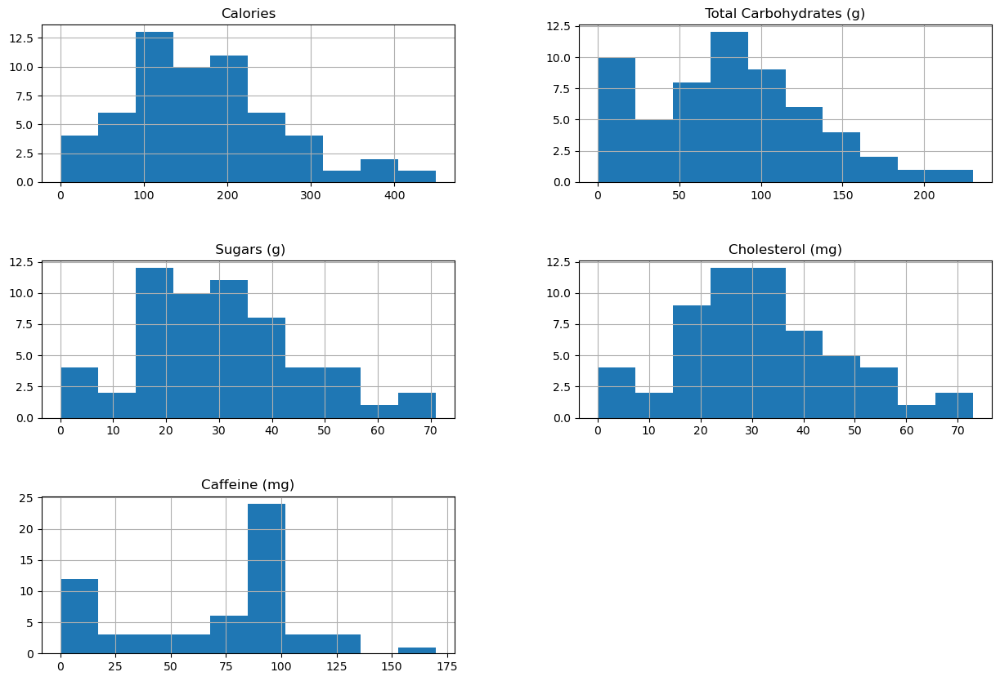

In [21]:
#Plot the histograms showing the 5 features for tea.
tea_dataset[['Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5);

In [22]:
#Show the top 5 lowest calories for tea.
tea_dataset[['Beverage',  'Beverage_prep', 'Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].sort_values(by='Calories').head().T


,102,103,104,105,166
Beverage,Tazo® Tea,Tazo® Tea,Tazo® Tea,Tazo® Tea,Shaken Iced Tazo® Tea (With Classic Syrup)
Beverage_prep,Short,Tall,Grande,Venti,Tall
Calories,0.0,0.0,0.0,0.0,60.0
Total Carbohydrates (g),0.0,0.0,0.0,0.0,0.0
Sugars (g),0.0,0.0,0.0,0.0,15.0
Cholesterol (mg),0.0,0.0,0.0,0.0,15.0
Caffeine (mg),89.520548,89.520548,89.520548,89.520548,170.0


### We see that the 4 lowest caloried tea are basically plain tea. All of the features we are interested in are all zero, which is great for low carbohydrate diet. The only possible negative is you get more caffeine than a can of Coke.

In [23]:
#Create a coffee dataset by selecting only items of Type = coffee. 
coffee_dataset = starbucks_dataset[starbucks_dataset['Type'] == 'coffee']
#Display the statistics of the 5 categories we are interested in.
coffee_dataset[['Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].describe().T

,count,mean,std,min,25%,50%,75%,max
Calories,175.0,197.011429,105.124775,3.0,120.0,180.0,260.0,510.0
Total Carbohydrates (g),175.0,144.685714,85.894540,0.0,80.0,140.0,200.0,340.0
Sugars (g),175.0,33.697143,21.226061,0.0,17.0,32.0,45.0,84.0
Cholesterol (mg),175.0,36.554286,21.951257,0.0,19.0,36.0,50.5,90.0
Caffeine (mg),175.0,100.940117,63.645487,0.0,75.0,95.0,150.0,410.0


### Reviewing the medians for coffee, it does not look promising that Starbucks's coffee are better than a can of Coke. We need to look a little bit deeper because the minimums do show some promise.

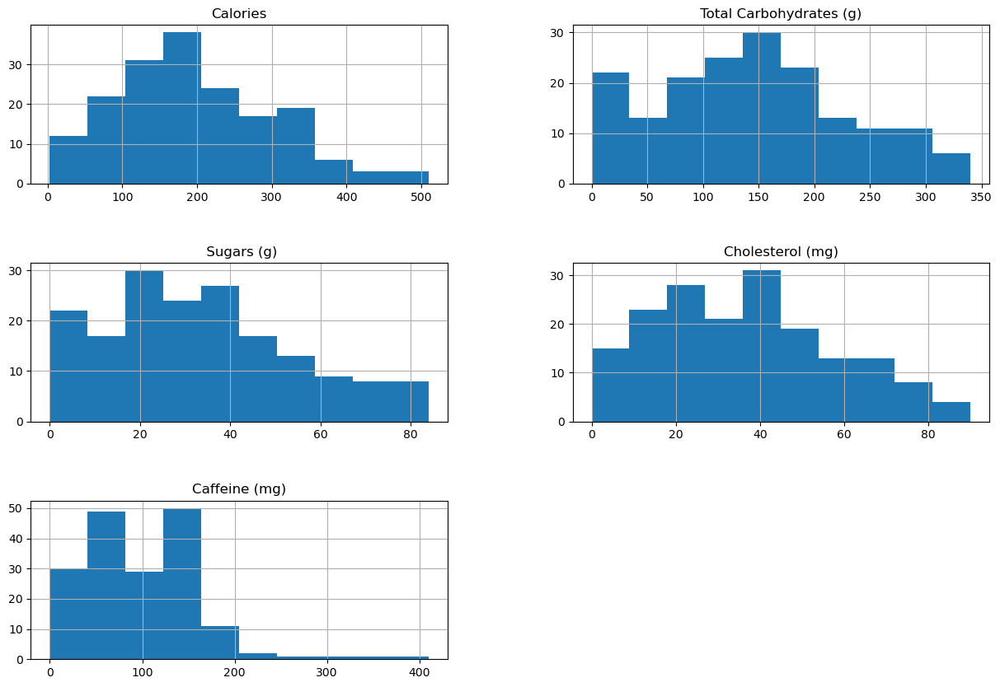

In [24]:
##Plot the histograms showing the 5 features for coffee.
coffee_dataset[['Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].hist(figsize=(15,10))
plt.subplots_adjust(hspace=0.5);

In [25]:
#Show the top 5 lowest calories for coffee.
coffee_dataset[['Beverage', 'Beverage_prep', 'Calories', ' Total Carbohydrates (g) ', ' Sugars (g)', 'Cholesterol (mg)', 'Caffeine (mg)' ]].sort_values(by='Calories').head().T

,0,1,2,3,40
Beverage,Brewed Coffee,Brewed Coffee,Brewed Coffee,Brewed Coffee,Caffè Americano
Beverage_prep,Short,Tall,Grande,Venti,Short
Calories,3.0,4.0,5.0,5.0,5.0
Total Carbohydrates (g),5.0,10.0,10.0,10.0,5.0
Sugars (g),0.0,0.0,0.0,0.0,0.0
Cholesterol (mg),0.0,0.0,0.0,0.0,1.0
Caffeine (mg),175.0,260.0,330.0,410.0,75.0


### In this case, the 5 lowest caloried coffee are plain brewed coffee. We do see quite a bit more caffeine than a can of Coke and the teas we identified above. Unfortunately, other than the short brewed coffee or caffe americano, we are seeing more carbohydrates that could work against a keto diet in particular. 

## CONCLUSION

### The answer to our questions of which coffee or tea are smarter and healthier choices for those on a diabetic, keto, or any low carbohydrate diet can be summed up to sticking with your basic tea or coffee with no additives. Additives seem to show a marked increase of calories, carbohydrates and sugars. For those who are particularly concerned with a low carbohydrate diet, tea appears to be the better choice.